# Response time minimization - Agder police district

### Version 4.0

- Goal: Minimize the response time of police vehicles to events within police district.
- The problem is formulated as a capacitated vehicle positioning problem using PuLP.


#### Agder police district
Agder police district is one of 12 police districts in Norway. It covers the entire Agder county and are responsible for 25 municipalities, where approx. 300,000 inhabitants.

In [1]:
# import watermark
%reload_ext watermark
%watermark

Last updated: 2024-04-13T20:45:06.513791+02:00

Python implementation: CPython
Python version       : 3.11.6
IPython version      : 8.22.2

Compiler    : MSC v.1935 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 158 Stepping 10, GenuineIntel
CPU cores   : 12
Architecture: 64bit



In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import shapely
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, mapping
from shapely.ops import nearest_points, unary_union
from descartes import PolygonPatch
import pyproj
import geopandas as gpd
import osmnx as ox
import networkx as nx
import pandana as pdna
import pulp
import highspy
import folium
import utilityModule # own custom functions

pd.set_option('display.float_format', lambda x: '%.3f' % x)
ox.settings.log_console=True
ox.settings.use_cache=True
%watermark -w
%watermark -iv

Watermark: 2.4.3

folium    : 0.16.0
highspy   : 1.5.3
geopandas : 0.14.3
shapely   : 2.0.3
numpy     : 1.26.4
networkx  : 3.2.1
pandana   : 0.7
osmnx     : 1.9.1
pandas    : 2.2.1
pulp      : 2.8.0
matplotlib: 3.8.3
pyproj    : 3.6.1



## 0. Load road network

We load a road network of Oslo police district that has been preprocessed.
- Network type: drive
- CRS: WGS84 EPSG:4326, will be converted to UTM33N EPSG:32633
- Network already contains edge weights (travel time in seconds)
- Node centrality measures has already been calculated for the network and stored as a CSV file.

In [3]:
### Load road network file of Øst police district, Norway
# Read from local path
Agder_filepath = "../data/Agder/AgderDriveImputed.graphml" # with travel time attribute
Agder_graph = ox.load_graphml(Agder_filepath) # originally in WGS84 (EPSG:4326)

In [4]:
Agder_graph = ox.projection.project_graph(Agder_graph, to_crs='EPSG:32633') # if need to project to UTM zone 33N
print(f"Type of Agder_graph: {type(Agder_graph)}")
print(f"CRS of Agder_graph:  {Agder_graph.graph['crs']}")

# plot graph
# fig, ax = ox.plot_graph(Agder_graph, node_size=1, edge_linewidth=0.2, edge_color="w", bgcolor="k")

Type of Agder_graph: <class 'networkx.classes.multidigraph.MultiDiGraph'>
CRS of Agder_graph:  EPSG:32633


Convert graph to GeoDataFrame and plot it.   
`osmnx.utils_graph.graph_to_gdfs(G, nodes=True, edges=True, node_geometry=True, fill_edge_geometry=True)` - Convert a MultiDiGraph to node and/or edge GeoDataFrames.

In [5]:
# converting the graph network to node and edge GeoPandas GeoDataFrames
nodes, edges = ox.graph_to_gdfs(Agder_graph, nodes=True, edges=True)
print(f"type of nodes:{type(nodes)}")
# nodes.head()
edges.head(2) # verify edges contain speed and travel time

type of nodes:<class 'geopandas.geodataframe.GeoDataFrame'>


osmid      highway  oneway reversed  \
u        v          key                                                         
10620171 4742796138 0                 481340888  residential   False    False   
         4742796105 0    [798640507, 481340862]    secondary   False    False   

                         length  \
u        v          key           
10620171 4742796138 0    37.260   
         4742796105 0   374.330   

                                                                  geometry  \
u        v          key                                                      
10620171 4742796138 0    LINESTRING (62633.100 6458567.396, 62632.264 6...   
         4742796105 0    LINESTRING (62633.100 6458567.396, 62662.101 6...   

                         speed_kph  travel_time   ref            name  \
u        v          key                                                 
10620171 4742796138 0       33.000        4.100   NaN             NaN   
         4742796105 0       55.000       24.500  3972  Harkmarksveien   

                         maxspeed bridge lanes junction tunnel access service  \
u        v          key                                                         
10620171 4742796138 0         NaN    NaN   NaN      NaN    NaN    NaN     NaN   
         4742796105 0    [60, 50]    NaN   NaN      NaN    NaN    NaN     NaN   

                        width  
u        v          key        
10620171 4742796138 0     NaN  
         4742796105 0     NaN

In [6]:
nodes.head(2) # verify nodes contain x and y coordinates

,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
10620171,6458567.396,62633.100,3,7.581,58.052,NaN,NaN,POINT (62633.100 6458567.396)
4742796138,6458531.514,62639.492,1,7.581,58.052,NaN,NaN,POINT (62639.492 6458531.514)


In [7]:
# print number of nodes and edges
print(f"Number of nodes: {len(nodes)}")
print(f"Number of edges: {len(edges)}")

Number of nodes: 34686
Number of edges: 74276


## 1. Simulate event points

Steps:  
1.1 Load preprocessed population data  
1.2 Event simulation based purely on population count. Should fall in range [2000,2500]  
1.3 Snap points to network (after defined Pandana network)  

### 1.1 Load preprocessed population data  

We load preprocessed population data in 250x250m grid cells from SSB - Oslo police district.
- Correct extent: Combined municipalities of  Asker, Bærum and Oslo.
- CRS: WGS84 EPSG:4326, will be converted to UTM33N EPSG:32633 before analysis.

In [8]:
# load preprocessed polygon data and convert to CRS UTM zone 33N (EPSG:32633)
Agder_polygon_path = "../data/Agder/AgderCombinedPolygon.geojson"
Agder_polygon_gdf = gpd.read_file(Agder_polygon_path)
Agder_polygon_gdf = Agder_polygon_gdf.to_crs(Agder_graph.graph['crs']) # convert to same CRS as the road network

In [9]:
# load preprocessed population data and convert to CRS UTM zone 33N (EPSG:32633)
population_path = "../data/Agder/AgderPopulation.geojson"
population_gdf = gpd.read_file(population_path)
population_gdf = population_gdf.to_crs(Agder_graph.graph['crs']) # convert to same CRS as the road network

In [10]:
print(f"type of pop_df: {type(population_gdf)}")
print(f"columns of population_gdf: {population_gdf.columns}")
population_gdf.head(2)

type of pop_df: <class 'geopandas.geodataframe.GeoDataFrame'>
columns of population_gdf: Index(['id', 'population', 'geometry'], dtype='object')


,id,population,geometry
0,20850006461500,63,"POLYGON ((85000.001 6461499.999, 85000.001 646..."
1,20852506461500,164,"POLYGON ((85250.001 6461499.999, 85250.001 646..."


### 1.2 Event simulation based on population counts

For each gridcell, simulated events are generated based on the population count and scaled with a self-adjustable factor that ensure the total number of simulated events will fall in the preferred range of [2000,2500].

In [11]:
# calculate the number of points to simulate in each grid cell - vectorized version
simulated_events_dict = utilityModule.simulate_event_points(population_gdf, pop_std_multiplier=0.006172363281250001, min_range=1500, max_range=1550)
population_gdf = simulated_events_dict["population_gdf"]

Total number of simulated event points: 1528. Target range [1500, 1550], using population multiplier: 0.007187500000000001
 Correction factor: 0.006172363281250001/0.007187500000000001 = 0.8587635869565218


In [12]:
# print the number of cells with 0, 1, 2, ..., 9 events
for i in range(0, 7):
    print(f"Nr of cells with {i} events: {len(population_gdf[population_gdf['num_points'] == i])}")

# print the cells with the highest number of points
population_gdf.nlargest(3, 'num_points')

Nr of cells with 0 events: 13652
Nr of cells with 1 events: 1189
Nr of cells with 2 events: 125
Nr of cells with 3 events: 18
Nr of cells with 4 events: 5
Nr of cells with 5 events: 3
Nr of cells with 6 events: 0


,id,population,geometry,num_points
9943,20882506466250,679,"POLYGON ((88250.001 6466249.999, 88250.001 646...",5
9979,20880006466500,716,"POLYGON ((88000.001 6466499.999, 88000.001 646...",5
10011,20882506466750,633,"POLYGON ((88250.001 6466749.999, 88250.001 646...",5


In [13]:
%%time
# List to hold all generated points
event_points = []
# Iterate over rows in your GeoDataFrame
for _, row in population_gdf.iterrows():
    # Extract number of points to generate for the current row
    num_points = row['num_points']
    if num_points > 0:  # Proceed only if there are points to generate
        # Generate points within the grid cell 
        points = utilityModule.generate_points_within_gridcell(num_points, row['geometry'].bounds)
        event_points.extend(points)

# Create a GeoDataFrame from the generated points
event_points_gdf = gpd.GeoDataFrame(geometry=event_points, crs=population_gdf.crs)
event_points_gdf.head(3)

CPU times: total: 938 ms
Wall time: 1.36 s


,geometry
0,POINT (85311.747 6461570.300)
1,POINT (84855.582 6461908.287)
2,POINT (85046.115 6461909.272)


In [14]:
# print number of nodes
print(f"Number of nodes: {len(nodes)}")

Number of nodes: 34686


In [15]:
# print(f"Number of nodes: {len(nodes)}")
high_pop_density_area = utilityModule.generate_high_density_polygon(event_points_gdf, grid_size=100, density_threshold=5.6e-11, simplification_tolerance=5.0, plot_results=False)

Density: Min: 2.276e-34 | Median: 6.652e-12 | Mean: 7.411e-11 | Max: 1.478e-09


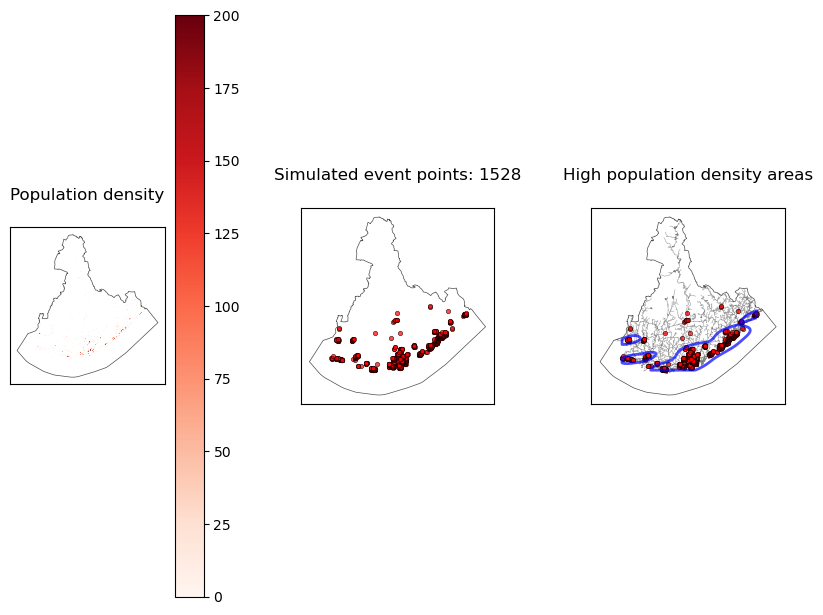

In [16]:
# Plot the population density, simulated event points, and high population density areas side-by-side
utilityModule.plot_population_density_and_event_points(Agder_polygon_gdf, population_gdf, event_points_gdf, high_pop_density_area, edges)

*(Skip using this kernel density function to constrain the sampling of car nodes)*

Function display stability issues for several districts. Might stem from the drawn polygon shape is cutoff by the district boundary.

## 2. Police car candidate points

Steps:  
2.1 Add Centrality measure as node attribute  
2.2 Sample candidate points and filter out poor candidate points

In [17]:
nodes.head(2)

,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
10620171,6458567.396,62633.100,3,7.581,58.052,NaN,NaN,POINT (62633.100 6458567.396)
4742796138,6458531.514,62639.492,1,7.581,58.052,NaN,NaN,POINT (62639.492 6458531.514)


### 2.1 Add Centrality measure as node attribute

Next we load the pre-computed closeness centrality and add it as an attribute to the nodes GeoDataFrame.  

*Closeness centrality is a measure of how close a node is to all other nodes in the network.   
It is calculated as the reciprocal of the sum of the shortest path distances from the node to all other nodes in the graph.*

In [18]:
# import node closeness centrality from file
# if centrality is in the nodes GeoDataFrame, drop it
if 'closeness_centrality' in nodes.columns:
    nodes.drop(columns=['closeness_centrality'], inplace=True)
if 'betweenness_centrality' in nodes.columns:
    nodes.drop(columns=['betweenness_centrality'], inplace=True)

nodes_centrality_import = pd.read_csv("../data/Agder/AgderNodeCentrality.csv")

In [19]:
# Now use the merge function. Since 'osmid' is the index in `nodes`, we can merge on the index
nodes = nodes.merge(nodes_centrality_import, left_index=True, right_on='osmid')
print(f"Number of nodes: {len(nodes)}")
nodes.head(2)


Number of nodes: 34686


,y,x,street_count,lon,lat,highway,ref,geometry,osmid,closeness_centrality,betweenness_centrality
0,6458567.396,62633.100,3,7.581,58.052,NaN,NaN,POINT (62633.100 6458567.396),10620171,0.000,14143501.000
945,6458531.514,62639.492,1,7.581,58.052,NaN,NaN,POINT (62639.492 6458531.514),4742796138,0.000,0.000


In [20]:
# After the merge, if you want 'osmid' as a column instead of an index, you can reset the index
nodes.reset_index(drop=True, inplace=True)
nodes.set_index('osmid', inplace=True)
nodes.head(2)

,y,x,street_count,lon,lat,highway,ref,geometry,closeness_centrality,betweenness_centrality
osmid,,,,,,,,,,
10620171,6458567.396,62633.100,3,7.581,58.052,NaN,NaN,POINT (62633.100 6458567.396),0.000,14143501.000
4742796138,6458531.514,62639.492,1,7.581,58.052,NaN,NaN,POINT (62639.492 6458531.514),0.000,0.000


Now, that the closeness centrality is added as an attribute to the ``nodes`` GeoDataFrame, we can use this to filter out better candidate locations for the police cars.

### 2.2 Sample candidate points and filter out poor candidate points

#### Steps:
1. Sample a set of random points from the road network (using the high population density areas as a polygon).
2. Filter out points that are too close to the border of the road network (closeness centrality threshold).
3. Filter out points that are too close to each other.
4. Filter out points that are too close to the existing police stations.

In [21]:
# random nodes from the graph
SEED = 2
NR_OF_CAR_NODES = 200

# sample X random source nodes from the area high_pop_density_area
car_nodes = nodes[nodes.within(high_pop_density_area.geometry.values[0])]
# car_nodes = nodes.copy()
car_nodes = car_nodes.sample(NR_OF_CAR_NODES, random_state=SEED, replace=False)
print(f"Total nr of nodes: {len(nodes)}, nr of police car nodes: {len(car_nodes)}")

# make car_nodes into a GeoDataFrame
car_nodes_gdf = gpd.GeoDataFrame(car_nodes, geometry=gpd.points_from_xy(car_nodes.x, car_nodes.y))
car_nodes.head(2)

Total nr of nodes: 34686, nr of police car nodes: 200


,y,x,street_count,lon,lat,highway,ref,geometry,closeness_centrality,betweenness_centrality
osmid,,,,,,,,,,
602804007,6480495.246,117826.827,3,8.474,58.299,NaN,NaN,POINT (117826.827 6480495.246),0.000,309215.000
4380914346,6482475.401,104455.804,4,8.244,58.304,NaN,NaN,POINT (104455.804 6482475.401),0.000,2487672.000


Input nr of car nodes: 200
Remaining nr of car nodes: 160, after discarding the 40 (20%) remote car nodes with lowest closeness centrality
Centrality Measure: closeness


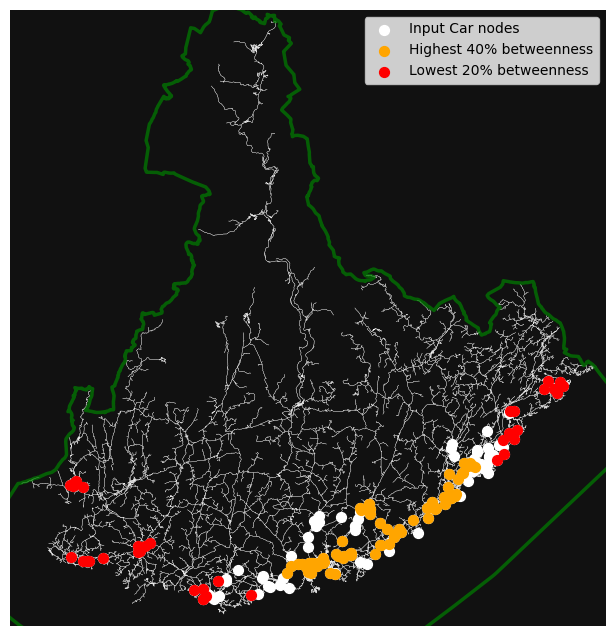

In [22]:
car_nodes_gdf_central1 = utilityModule.filter_by_centrality(geo_df=car_nodes_gdf, district_boundary=Agder_polygon_gdf, 
                            top_percent=0.4, bottom_percent=0.20, input_graph=Agder_graph, centrality_measure="closeness", plot=True)

Input nr of car nodes: 160
Remaining nr of car nodes: 96, after discarding the 64 (40%) remote car nodes with lowest betweenness centrality
Centrality Measure: betweenness


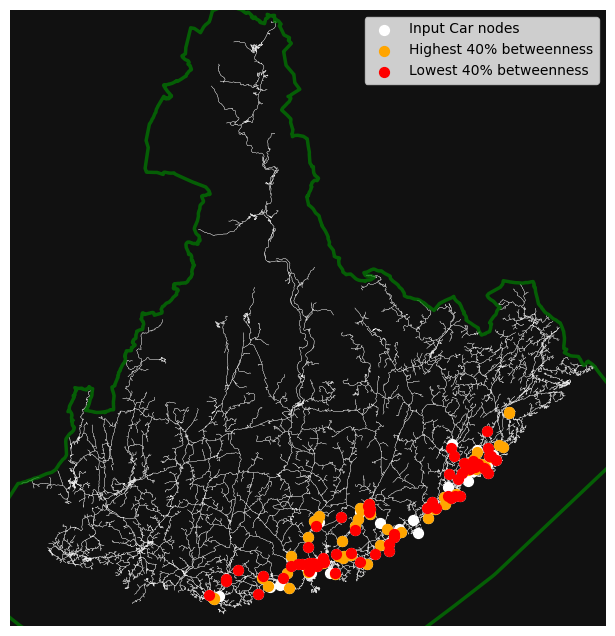

In [23]:
car_nodes_gdf_central2 = utilityModule.filter_by_centrality(geo_df=car_nodes_gdf_central1, district_boundary=Agder_polygon_gdf, top_percent=0.4, bottom_percent=0.40, 
                                                            input_graph=Agder_graph, centrality_measure="betweenness", plot=True)

Input nr of car nodes: 96
Remaining nr of car nodes: 25, after removing the 71 nodes that are within 4000 m of each other



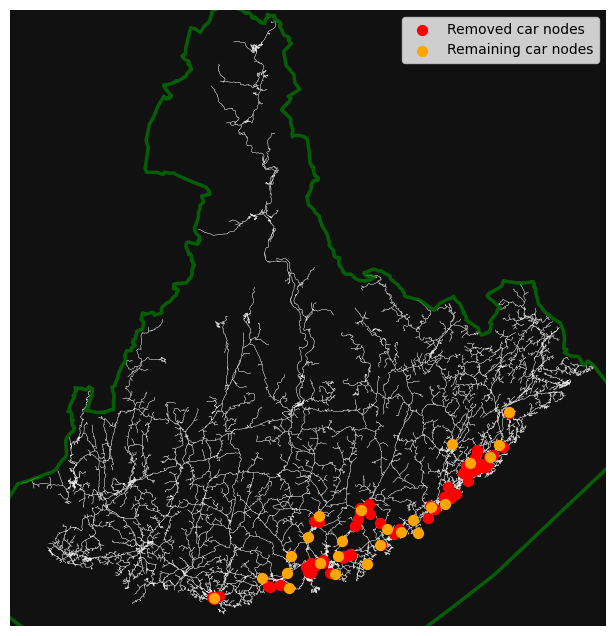

In [25]:
car_nodes_gdf_filtered = utilityModule.filter_nodes_by_proximity(geo_df=car_nodes_gdf_central2, district_boundary=Agder_polygon_gdf, 
                        min_distance=4000, input_graph=Agder_graph, criterion_col='betweenness_centrality', prefer='higher', plot=True)

## 3. Define the Pandana network

Now we use the GeoDataFrames from `osmnx` to create a `pandana` network.

Pandana networks is defined like this:   
`pandana.network.Network(node_x, node_y, edge_from, edge_to, edge_weights, twoway=True)`  

 **edge_weights**: DataFrame, all numerics   
- Specifies one or more impedances on the network which define the distances between nodes.  
- Multiple impedances can be used to capture travel times at different times of day, for instance.

We will use both ``length`` and ``travel_time`` as edge weights. However, we must specify which one to use when querying the network (cannot calculate with both at the same time).

In [26]:
# reset index so our origins and destinations are not in index
edges = edges.reset_index()
# nodes = nodes.reset_index()

# create network with pandana
Agder_network_pdna = pdna.Network(node_x=nodes['x'], node_y=nodes['y'], edge_from=edges['u'], edge_to=edges['v'], 
                                      edge_weights=edges[["length", "travel_time"]], twoway=True)

# Print stats about the network
print(f"type of Agder_network_pdna: {type(Agder_network_pdna)}")
print(f"Network nodes:")
Agder_network_pdna.nodes_df.head(2)

type of Agder_network_pdna: <class 'pandana.network.Network'>
Network nodes:


,x,y
osmid,,
10620171,62633.100,6458567.396
4742796138,62639.492,6458531.514


In [27]:
print(f"Network edges: ")
Agder_network_pdna.edges_df.head(2)

Network edges: 


,from,to,length,travel_time
0,10620171,4742796138,37.260,4.100
1,10620171,4742796105,374.330,24.500


In [28]:
# %%time
# Agder_network_pdna.precompute(3000)

Recall that the Car Nodes were directly sampled from the road network, while event points were generated outside the road network. Therefore, we need to snap the event points to the Pandana network.

In [29]:
# identify nearest node to each event point
event_points_gdf['nearest_node'] = Agder_network_pdna.get_node_ids(event_points_gdf.geometry.x, event_points_gdf.geometry.y, mapping_distance=1000)

# With nearest_node attribute, find osm x,y coordinates
event_points_gdf = event_points_gdf.merge(nodes[['x', 'y']], left_on='nearest_node', right_index=True, suffixes=('', '_nearest_node'))
event_points_gdf.head(2)

,geometry,nearest_node,x,y
0,POINT (85311.747 6461570.300),5485317012,85405.202,6461597.802
1,POINT (84855.582 6461908.287),5485314643,84903.200,6461927.998


In [30]:
# Get list of nearest node ids for event locations
event_nodes_pdna = Agder_network_pdna.get_node_ids(x_col=event_points_gdf.geometry.x, y_col=event_points_gdf.geometry.y).values
event_nodes_pdna[:5]

# get the nearest node ids (in this case, just selecting the 'osmid')
car_nodes_pdna = Agder_network_pdna.get_node_ids(x_col=car_nodes_gdf_filtered.x, y_col=car_nodes_gdf_filtered.y).values
car_nodes_pdna[:5]

array([3351206979, 5181858964, 4377728772, 4370104729, 1967180581],
      dtype=int64)

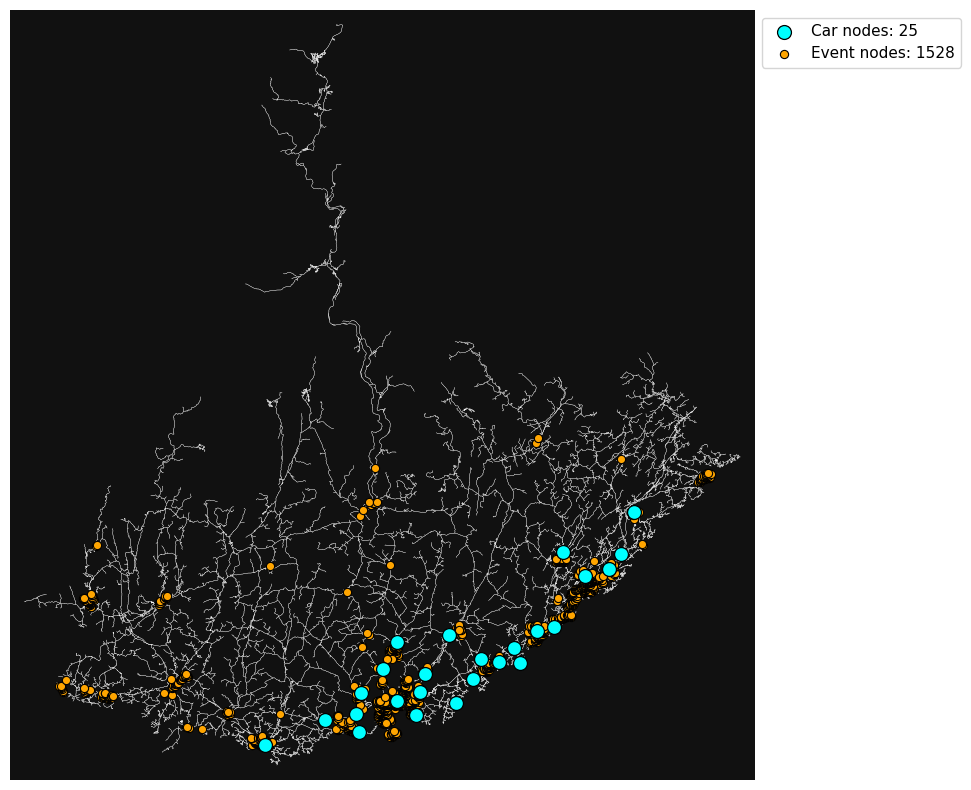

In [31]:
# Plot overview of Car nodes and Event nodes
fig, ax = ox.plot_graph(Agder_graph, node_color="white", node_size=0, edge_linewidth=0.2, edge_color="w", show=False, close=False, figsize=(10,10))
ax.scatter(car_nodes_gdf_filtered['x'], car_nodes_gdf_filtered['y'], c='cyan', edgecolor='black', lw=0.90, s=100, label=f"Car nodes: {len(car_nodes_gdf_filtered)}", zorder=3)
ax.scatter(event_points_gdf['x'], event_points_gdf['y'], c='orange', s=35, edgecolor='black', lw=0.80, label=f"Event nodes: {len(event_points_gdf)}", zorder=2)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=11)
plt.show()

## 4. Cost Matrix - Calculate all origin-destination pairs

First, identify the nearest node to each Police car and Event.
- [network.get_node_ids()](http://udst.github.io/pandana/network.html#pandana.network.Network.get_node_ids)

In [32]:
# Creating origins-destination pairs
origins = np.repeat(car_nodes_pdna, len(event_nodes_pdna))
destinations = np.tile(event_nodes_pdna, len(car_nodes_pdna))

In [33]:
%%time
# distance between each possible pair of facilities-clients combination
distances = Agder_network_pdna.shortest_path_lengths(origins, destinations, imp_name='length')
travel_times = Agder_network_pdna.shortest_path_lengths(origins, destinations, imp_name='travel_time')

print(type(travel_times))
print("Number of travel_times calculated: ", len(travel_times))
print("5 first origin-destination distances [m]     :", distances[:5])
print("5 first origin-destination travel times [sec]:", travel_times[:5])

<class 'list'>
Number of travel_times calculated:  38200
5 first origin-destination distances [m]     : [34677.794, 34259.158, 34079.228, 33735.914, 34518.719]
5 first origin-destination travel times [sec]: [1692.4, 1611.4, 1589.9, 1556.7, 1642.5]
CPU times: total: 1.2 s
Wall time: 172 ms


In [34]:
# print the statistics for distances and travel times
# print("Distances statistics:")
# print(pd.Series(distances).describe())
print("\nTravel times statistics:")
print(pd.Series(travel_times).describe())


Travel times statistics:
count   38200.000
mean     2282.061
std      1514.360
min         0.000
25%      1143.575
50%      1908.650
75%      3168.175
max      9184.100
dtype: float64


In [35]:
# Restructure the distances and travel times arrays into a DataFrame (CAgder Matrix) and add the car and event node ids as columns

# create a DataFrame from the distances and travel times arrays
CostMatrix = pd.DataFrame({'distance': distances, 'travel_time': travel_times})

# add the car and event node ids as columns
CostMatrix['carNodeID'] = np.repeat(car_nodes_pdna, len(event_nodes_pdna))
CostMatrix['eventNodeID'] = np.tile(event_nodes_pdna, len(car_nodes_pdna))
CostMatrix.head() # distances, travel times, car and event node ids

# merge the distances DataFrame with the car and event nodes DataFrames to get the coordinates
CostMatrix_extended = CostMatrix.merge(nodes[['x', 'y']], left_on='carNodeID', right_index=True, suffixes=('', '_car'))
CostMatrix_extended = CostMatrix.merge(nodes[['x', 'y']], left_on='eventNodeID', right_index=True, suffixes=('', '_event'))
CostMatrix.head(2)

,distance,travel_time,carNodeID,eventNodeID
0,34677.794,1692.400,3351206979,5485317012
1,34259.158,1611.400,3351206979,5485314643


In [36]:
CostMatrix_extended.head(2) # distances, travel times, car and event node coordinates

,distance,travel_time,carNodeID,eventNodeID,x,y
0,34677.794,1692.400,3351206979,5485317012,85405.202,6461597.802
1,34259.158,1611.400,3351206979,5485314643,84903.200,6461927.998


In [37]:
# Save cAgder matrix to CSV
CostMatrix.to_csv("../data/Agder/AgderCostMatrix.csv", index=False)

# # import cAgder matrix from CSV
# CostMatrix_imported = pd.read_csv("../data/Agder/AgderCostMatrix.csv")
# CostMatrix_imported.head(2)

CostMatrix.drop(columns="distance", inplace=True)

Now, we have made Cost Matrices with distances and travel times between each police car and event node pair.
- ``CostMatrix`` is the lean cost matrix that will be used for further computations in optimization problems. - *saved as local .csv file for later use*
- ``CostMatrix_extended`` is the cost matrix extended with coordinate information. Useful for post-optimization tasks.

# 5. Optimization problem

### 5.1 Formulating the problem
We will use the Python library PuLP to model and solve the optimization problem.   
The objective is to minimize the total response time to events, by optimally positioning a fixed number of police cars.

### Notation

Let's define the notation that will be used to formulate the problem:
- $N$ : The set of all nodes in the road network.
- $E$ : The set of events, each associated with a node in $N$ and a severity score.
- $P$ : The set of potential police car locations, a subset of $N$.
- $C_{ij}$ : The travel time from police car location $i \in P$ to event location $j \in E$.
- $x_i$ : Binary decision variable where $x_i = 1$ if a police car is positioned at node $i$, and $x_i = 0$ otherwise.
- $y_{ij}$ : Binary decision variable where $y_{ij} = 1$ if the event $j$ is assigned to the police car located at $i$, and $y_{ij} = 0$ otherwise.

### Objective Function
The objective is to minimize the total response time to all events. The response time is the travel time from a police car to an event, considering only the assignments where $y_{ij} = 1$.
$$
\text{Minimize} \quad Z = \sum_{i \in P} C_{ij} \cdot y_{ij}
$$

### Constraints
1. **Police Car Placement Constraint**: Only $K$ police cars are available to be deployed.
$$
\sum_{i \in P} x_i = K
$$

2. **Event Assignment Constraint**: Each event must be assigned to exactly one police car.
$$
\sum_{i \in P} y_{ij} = 1 \quad \forall j \in E
$$

3. **Validity Constraint**: An event can only be assigned to a police car if that car is positioned at a node.
$$
y_{ij} \leq x_i \quad \forall i \in P, \forall j \in E
$$

4. **Capacity Constraint**: Each police car can only be assigned to a limited number of events.
$$
\sum_{j \in E} y_{ij} \leq M_i \cdot x_i \quad \forall i \in P
$$

5. **Non-Negativity and Integrality**: Ensure that the decision variables are binary.
$$
x_i \in \{0, 1\} \quad \forall i \in P
$$
$$
y_{ij} \in \{0, 1\} \quad \forall i \in P, \forall j \in E
$$


### 5.2 Preprocessing data structures for efficient computation

In [38]:
%%time
# find the total number of unique events from the reduced cAgder matrix
nr_of_unique_events = CostMatrix['eventNodeID'].nunique()
print(f"Total number of unique events: {nr_of_unique_events}")

# Preprocess the cAgder matrix
# 1) Convert to a dictionary for fast lookup
# 2) Reduce problem size: Remove top x% travel times, as there is probably a closer car to the event
DISCARD_THRESHOLD = 0.00
CostMatrix_dict_reduced = utilityModule.preprocess_cost_matrix(CostMatrix, discard_threshold=DISCARD_THRESHOLD, verbose=True)

Total number of unique events: 1460
Filtering out 0% highest travel times - keeping only travel times <= 9184 sec, or 153.1 min
Original nr of pairs: 36500 | Filtered nr of pairs: 36500
Original max travel time: 9184.1 | Filtered max travel time: 9184.1
Original min travel time: 0.0 | Filtered min travel time: 0.0
CPU times: total: 15.6 ms
Wall time: 48.8 ms


### 5.2 Setup LP problem

In [39]:
# Constants
NR_OF_CARS = 4
CAR_CAPACITY = 450

# # Sets
P = CostMatrix['carNodeID'].unique()  # Potential police car locations
E = CostMatrix['eventNodeID'].unique()  # Events

# Define PuLP problem
problem = utilityModule.define_pulp_problem(CostMatrix, CostMatrix_dict_reduced, 
    nr_of_cars=NR_OF_CARS, car_capacity=CAR_CAPACITY, problem_name="PoliceCarLocationOptimization", verbose=True)

Number of police car locations: 25
Number of events: 1460


Number of decision variables: 36525
Number of constraints: 37986
Number of non-zero coefficients: 36525
Number of non-zero coefficients in the objective function: 36499
PuLP Problem setup took 2.52 seconds


### 5.5 Run the solvers

- **PULP_CBC (COIN-OR Branch and Cut)** - open-source solver that is included in the PuLP package.
- **HiGHS (High-Performance Solver)** - a high-performance solver that use the HiGHS optimization engine.

1st run of each solver will relax the integer variable constraint (`mip=False`) for fast computation. 2nd run of each solver will use proper integer constraints (`mip=True`) to get the slow, final solution for verification.

*Recall this is a minimization problem, so the lower the objective value, the better the solution.*

In [40]:
# Inspect available pulp solvers
pulp.listSolvers(onlyAvailable=True)

['GLPK_CMD', 'PULP_CBC_CMD', 'COIN_CMD', 'HiGHS']

In [41]:
%%time
# Run the solver
solve = utilityModule.run_solvers(problem, P, nr_of_locations=4, 
                                solver_name='PULP_CBC_CMD', forceMIP=False, plot=False)
print(f"(Note: Currently reducing the Cost matrix by {DISCARD_THRESHOLD*100:.0f}%)")

PULP_CBC_CMD with LP relaxation found 3/4 locations in 6.12 seconds.
Switching to MILP solver configuration to find optimal solution.

Optimal police car locations found: 4/4 in 21.76 seconds: [4377728772 5233588206 5471589386 4741844911]
Solver: PULP_CBC_CMD | Status: 1 (Optimal)
Objective function value (total response time): 1168892.6910 seconds, or 19481.54 minutes, or 324.69 hours
(Note: Currently reducing the Cost matrix by 0%)
CPU times: total: 4.92 s
Wall time: 31.7 s


### 5.6 Extract results for inspection

In [42]:
# Extract optimal police car locations
optimal_locations = {i: problem.variablesDict()[f"x_{i}"].varValue for i in P if problem.variablesDict()[f"x_{i}"].varValue == 1}
print("Optimal police car locations:", optimal_locations.keys())

# convert to geodataframe for plotting. Should contain the carNodeID and the geometry (Point)
optimal_locations_gdf = gpd.GeoDataFrame(geometry=[Point(nodes.loc[node, 'x'], nodes.loc[node, 'y']) for node in optimal_locations.keys()], crs="EPSG:32633")
optimal_locations_gdf['carNodeID'] = optimal_locations.keys()
carNodeID_list = list(optimal_locations_gdf['carNodeID'])

car_to_events_df = utilityModule.create_car_to_events_df(CostMatrix_extended, optimal_locations, problem, 
                                                         CAR_CAPACITY, nr_of_unique_events, verbose=True)

Optimal police car locations: dict_keys([4377728772, 5233588206, 5471589386, 4741844911])
Car 4377728772 is assigned 425/450 events
Car 5233588206 is assigned 343/450 events
Car 5471589386 is assigned 450/450 events
Car 4741844911 is assigned 242/450 events
Summing the events for each car gives 1460 events, which should equal the total number of unique events: 1460


## 6. Visualization

### 6.1 Plot the optimal police car locations and events

Input parameters:
- Possible police car locations: 25 | Optimal locations in solution: 4
- Events: 1460 | Max event capacity per police car: 450

Solution from Linear Programming (LP) model:
Goal: minimize objective function (total response time)
Objective function value: 1168893 sec | 19481.5 min | 324.69 hours

Car id: 4377728772 handles 425 events | Capacity: 94.44% | Total response time: 4180.38 min | Median: 8.40 min | Avg: 9.84 min
Car id: 5233588206 handles 343 events | Capacity: 76.22% | Total response time: 3765.94 min | Median: 7.66 min | Avg: 10.98 min
Car id: 5471589386 handles 450 events | Capacity: 100.00% | Total response time: 2837.58 min | Median: 5.74 min | Avg: 6.31 min
Car id: 4741844911 handles 242 events | Capacity: 53.78% | Total response time: 5946.14 min | Median: 23.87 min | Avg: 24.57 min
Response time is multiplied by 0.86 to match the standard population_multiplier (median of all districts)


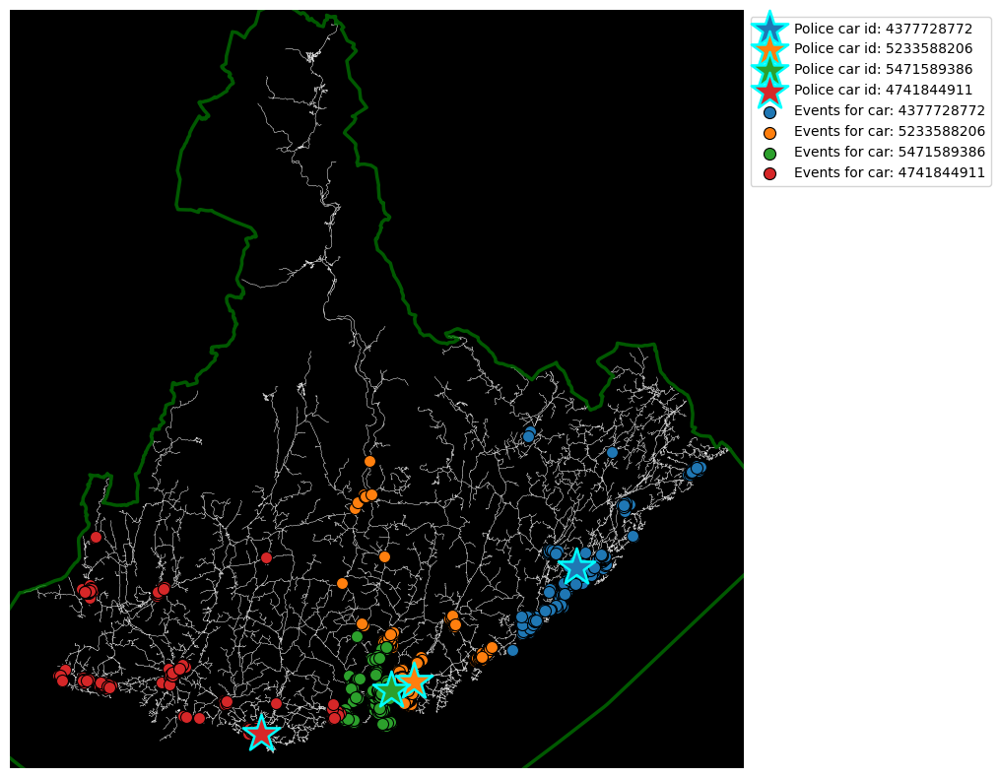

CPU times: total: 4.69 s
Wall time: 5.69 s


In [44]:
%%time
correction_factor = simulated_events_dict["correction_factor"]
utilityModule.plot_optimal_allocations(Agder_graph, Agder_polygon_gdf, optimal_locations_gdf, car_to_events_df, 
                car_nodes_gdf_filtered, nr_of_unique_events, NR_OF_CARS, CAR_CAPACITY, problem, correction_factor)

## 6.2 Visualize Isochrones - How far can you drive in different time intervals?
How far can you drive in 1.5, 4 and 8 minutes from the origin nodes? We'll use NetworkX to induce a subgraph of gruner_graph within each distance, based on travel time.  
We also, plot isochrones as buffers to get more faithful isochrones than convex hulls can offer.

In [158]:
# Define how many trip times to visualize
TRIP_TIMES = [20, 40, 120]  # in minutes
ISO_COLORS = ['blue', 'magenta', 'yellow']  # Long, Middle, Short ranges

Isochrone polygons for the travel times: [20, 40, 120] minutes


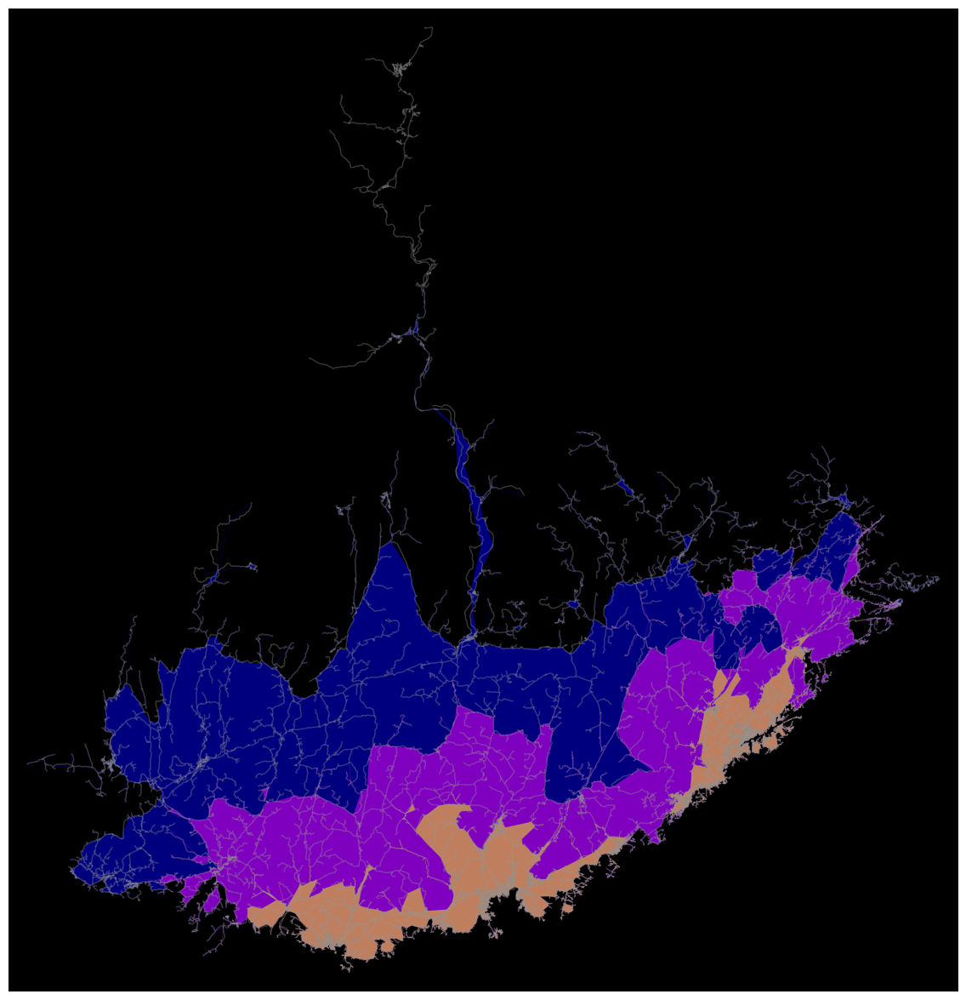

CPU times: total: 3min 26s
Wall time: 5min 48s


In [159]:
%%time
# Generate isochrone polygons
isochrone_polys = utilityModule.make_iso_polys(Agder_graph, TRIP_TIMES, carNodeID_list, 
                                                edge_buff=30, node_buff=0, infill=True)

# Merge isochrones
merged_isochrones = utilityModule.merge_isochrones(Agder_graph, isochrone_polys)

# Plotting the graph and merged isochrones
fig, ax = ox.plot_graph(Agder_graph, show=False, close=False, edge_color='#999999', edge_alpha=0.2, node_size=0, bgcolor='k', figsize=(15, 15))

# Plotting merged isochrones with colors
# iso_colors = ['blue', 'magenta', 'yellow']  # Long, Middle, Short ranges
for merged_poly, color in zip([merged_isochrones[0], merged_isochrones[1], merged_isochrones[2]], ISO_COLORS):
    if isinstance(merged_poly, MultiPolygon):
        for poly in merged_poly.geoms:
            patch = PolygonPatch(poly, fc=color, ec='none', alpha=0.5, zorder=-1)
            ax.add_patch(patch)
    else:
        patch = PolygonPatch(merged_poly, fc=color, ec='none', alpha=0.5, zorder=-1)
        ax.add_patch(patch)

print("Isochrone polygons for the travel times:", TRIP_TIMES, "minutes")
plt.show()

In [160]:
%%time
# Plot leaflet map
graph_map = utilityModule.plot_leaflet_map(Agder_graph, TRIP_TIMES, merged_isochrones, Agder_polygon_gdf, background_poly=True)
graph_map

CPU times: total: 1.09 s
Wall time: 1.94 s
